> **This notebook demonstrates how to perform simple OCR on a bank receipt dataset. The data is already in digital format, so the model only needs to learn from printed characters using common font families (Arial, Times New Roman, etc.) without requiring a camera-scanned receipt.**


In [32]:
import pandas as pd
import numpy as np
from pathlib import Path
from IPython.display import display
import matplotlib.pyplot as plt
import cv2
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import joblib

# 1. Dataset Preparation


In [2]:
dataset_dir = Path("../../input/individual_characters")

dataset_info = pd.read_csv(dataset_dir / "metadata.csv")

display(dataset_info.head(20))
display(dataset_info.describe())
display(dataset_info.info())

,filepath,label
0,alphabetic/a/a-01.png,a
1,alphabetic/a/a-02.png,a
2,alphabetic/a/a-03.png,a
3,alphabetic/a/a-04.png,a
4,alphabetic/a/a-05.png,a
5,alphabetic/a/a-06.png,a
6,alphabetic/a/a-07.png,a
7,alphabetic/a/a-08.png,a
8,alphabetic/b/b-01.png,b
9,alphabetic/b/b-02.png,b


,filepath,label
count,439,439
unique,439,38
top,alphabetic/a/a-01.png,0
freq,1,41


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 439 entries, 0 to 438
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filepath  439 non-null    object
 1   label     439 non-null    object
dtypes: object(2)
memory usage: 7.0+ KB


None

Display some dataset as preview and inspecting data


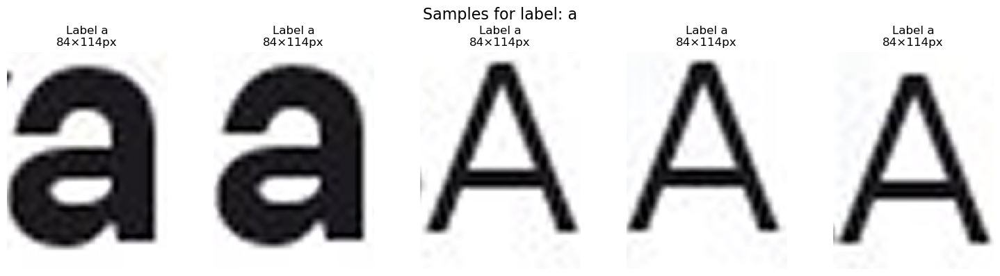

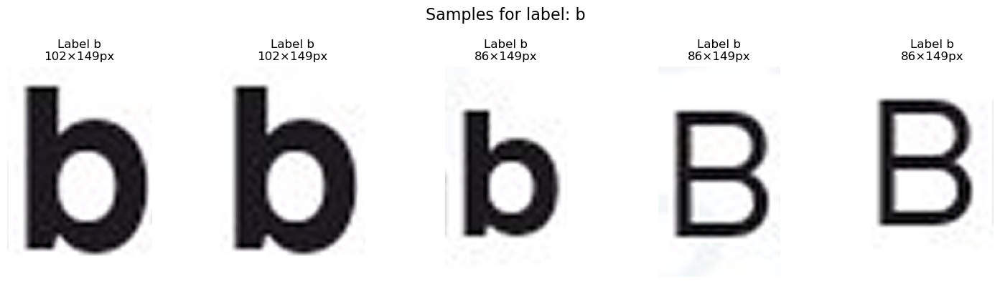

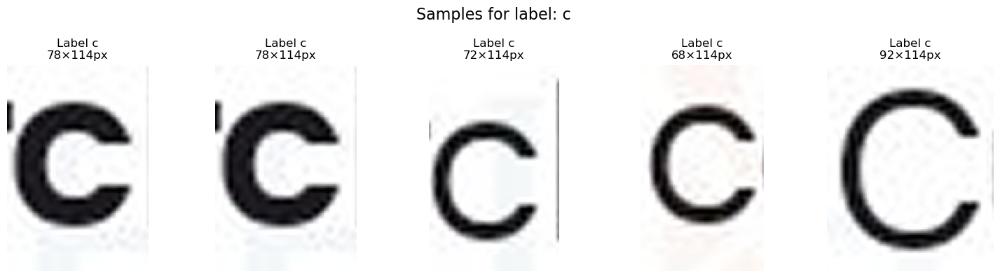

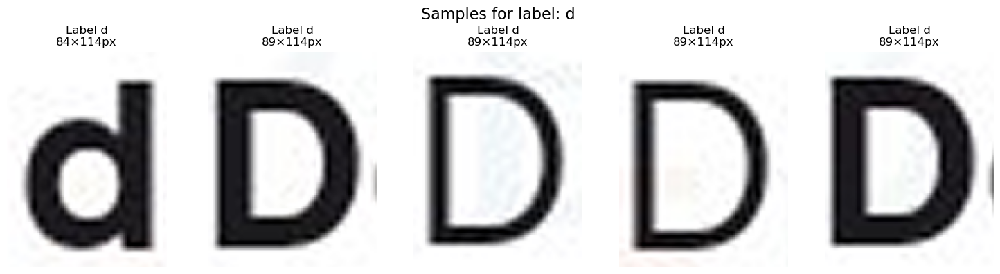

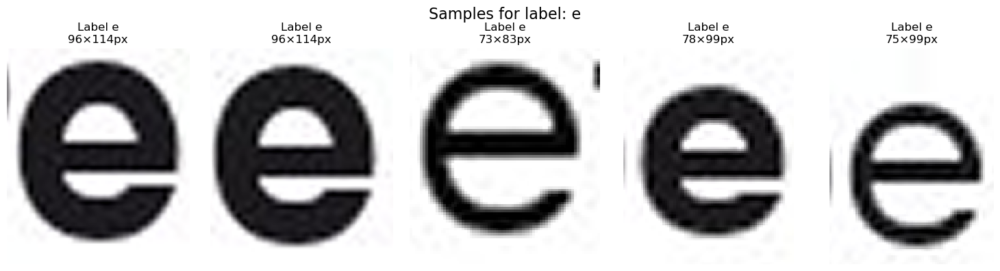

...

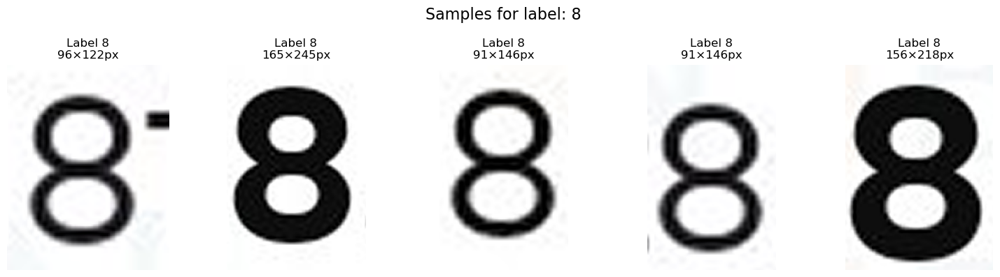

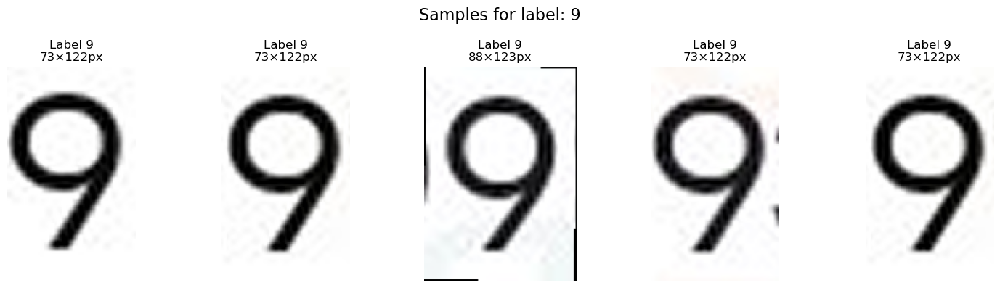

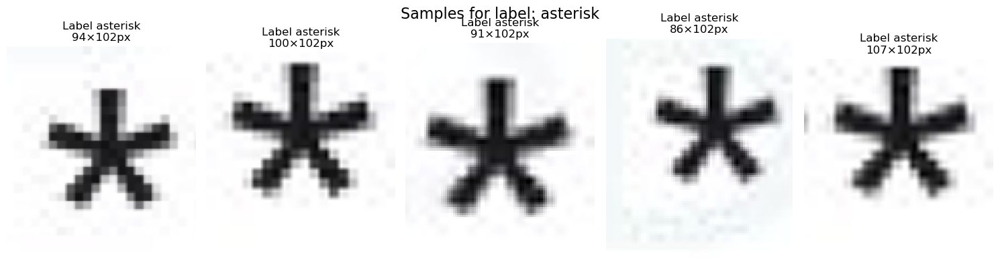

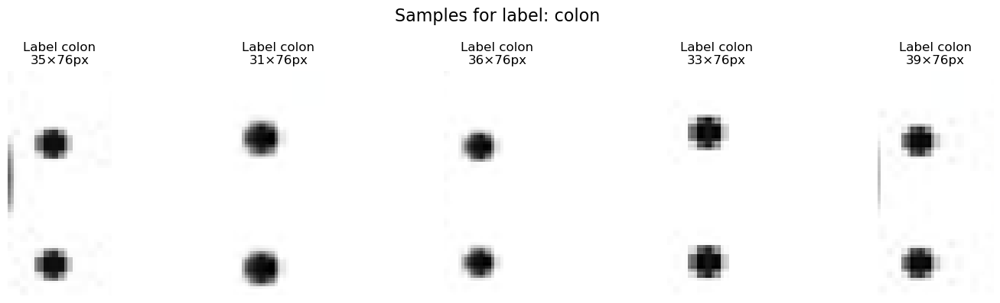

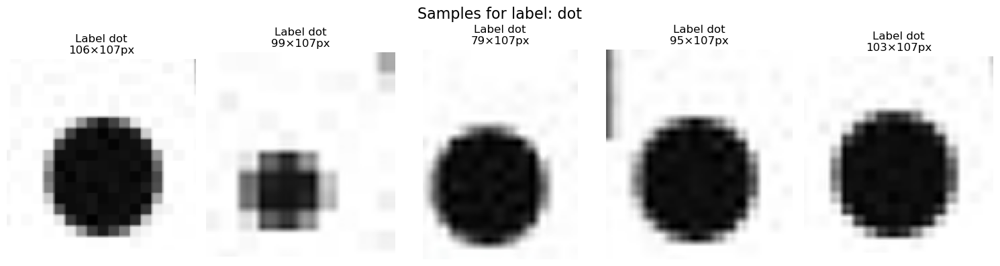

In [3]:
def show_images_by_label(df: pd.DataFrame, title: str, samples_per_label=5):
    labels = df["label"].unique()

    for label in labels:
        subset = df[df["label"] == label].head(samples_per_label)

        plt.figure(figsize=(15, 4))
        for i, (_, row) in enumerate(subset.iterrows()):
            img_path = str(dataset_dir / row["filepath"])
            img = cv2.imread(img_path)

            if img is None:
                print(f"Image not found: {img_path}")
                continue

            # BGR → RGB
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # resolution
            h, w = img.shape[:2]

            plt.subplot(1, samples_per_label, i + 1)
            plt.imshow(img)
            plt.title(f"Label {label}\n{w}×{h}px")
            plt.axis("off")

        plt.suptitle(f"Samples for label: {label}", fontsize=16)
        plt.tight_layout()
        plt.show()


show_images_by_label(dataset_info, "Dataset Info", samples_per_label=5)

The dataset looks unnormalized. So, we need to make a proper data preprocessing.


# 2. Data Preprocessing

In this process, we will do 3 simple preprocessing technique:

- grayscaling,
- resizing,
- flatten,
- and normalizing


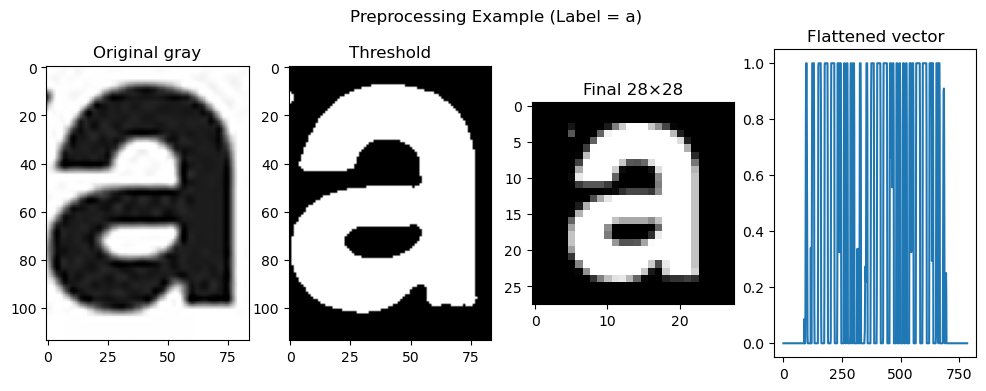

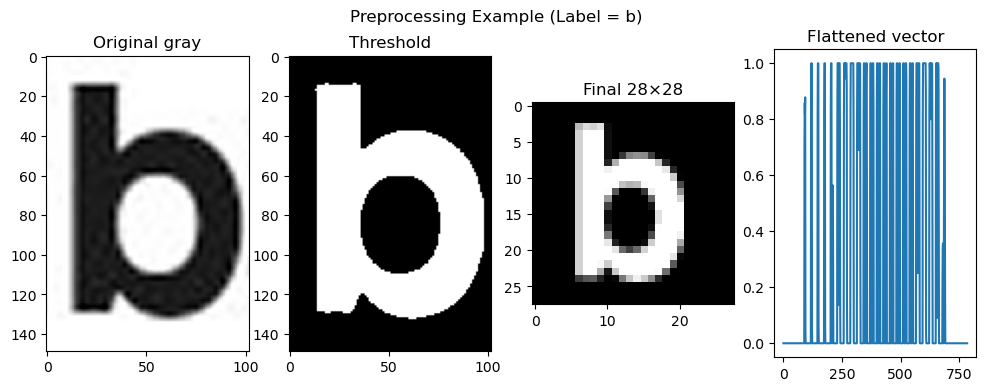

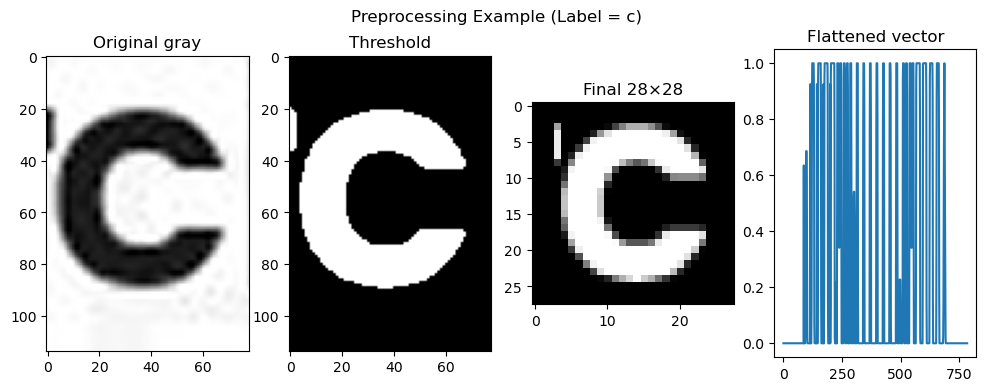

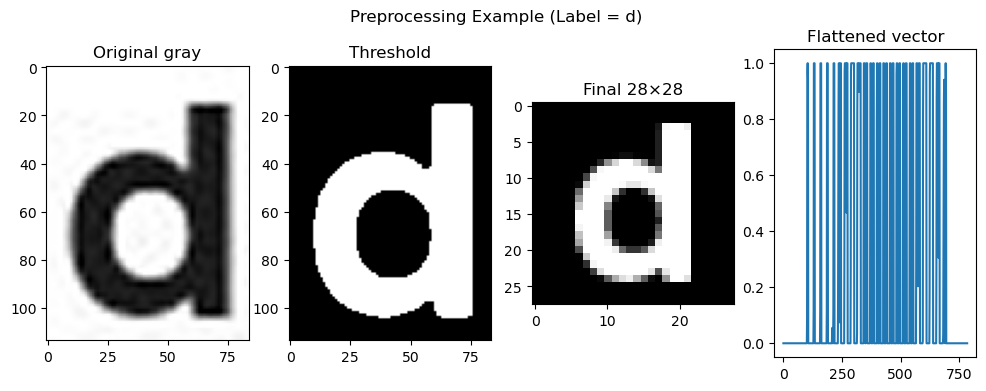

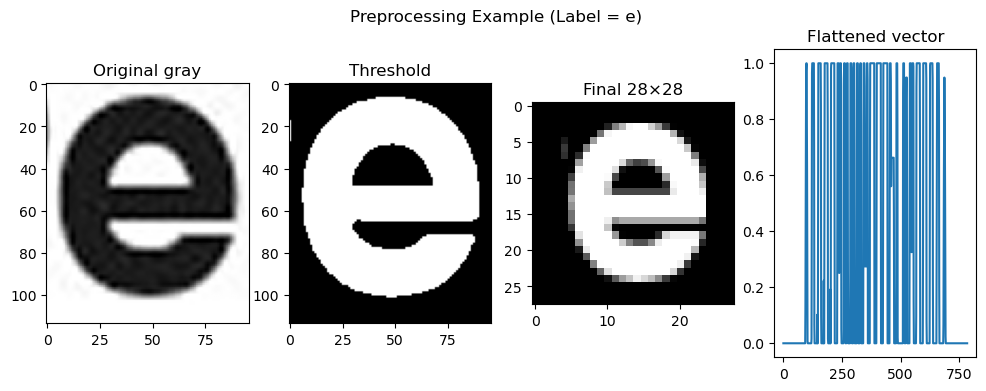

...

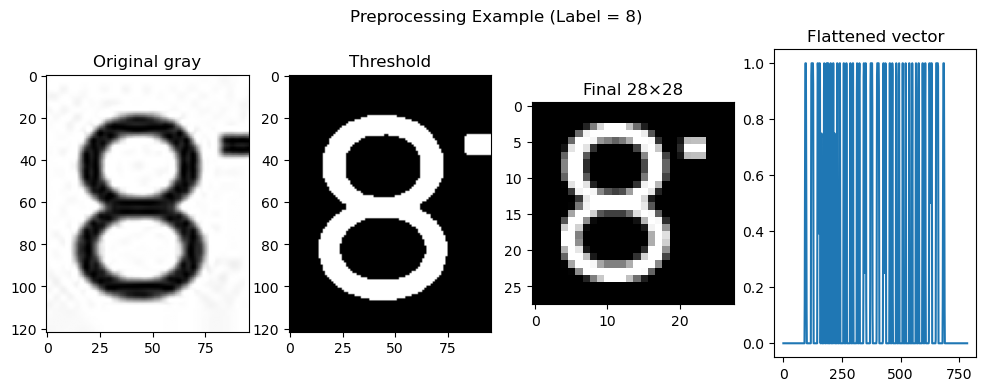

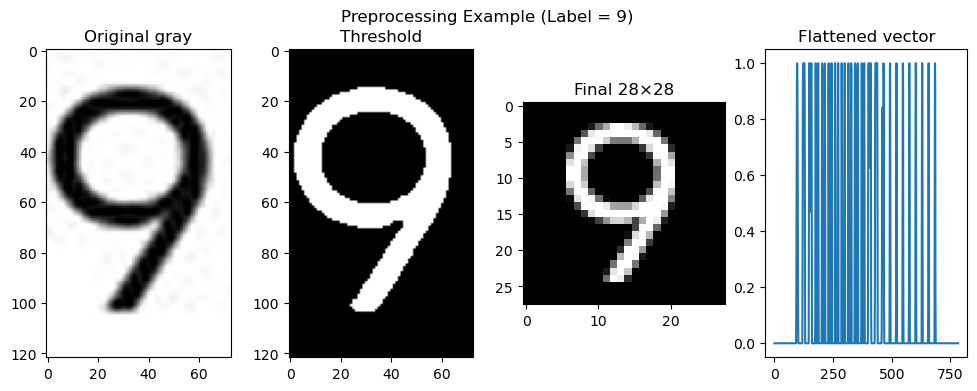

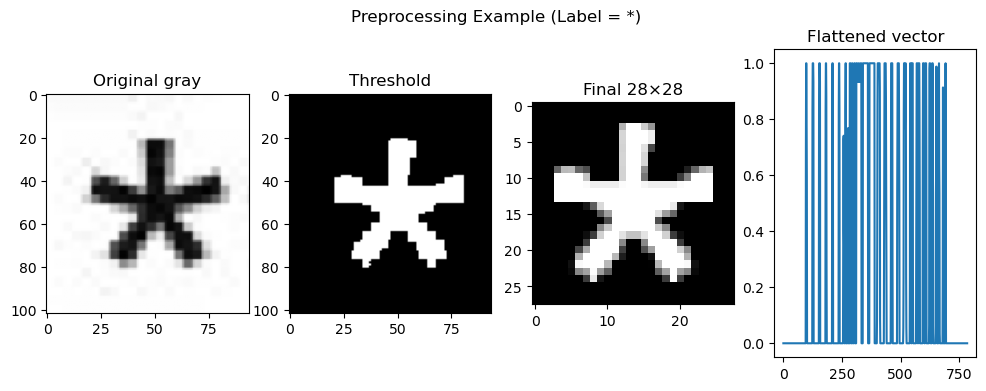

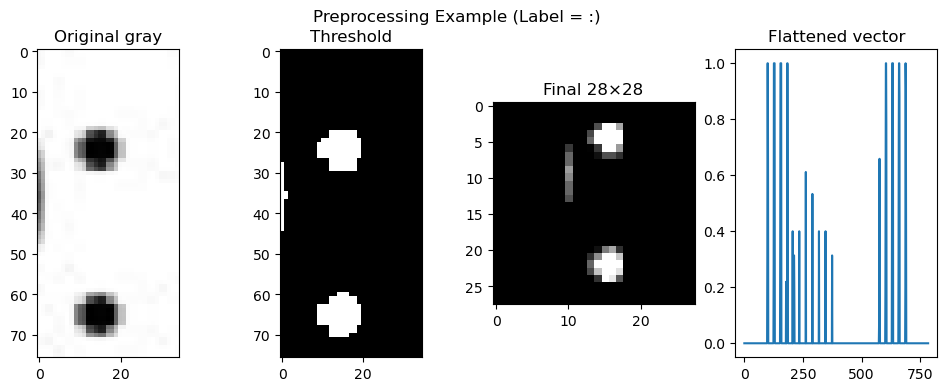

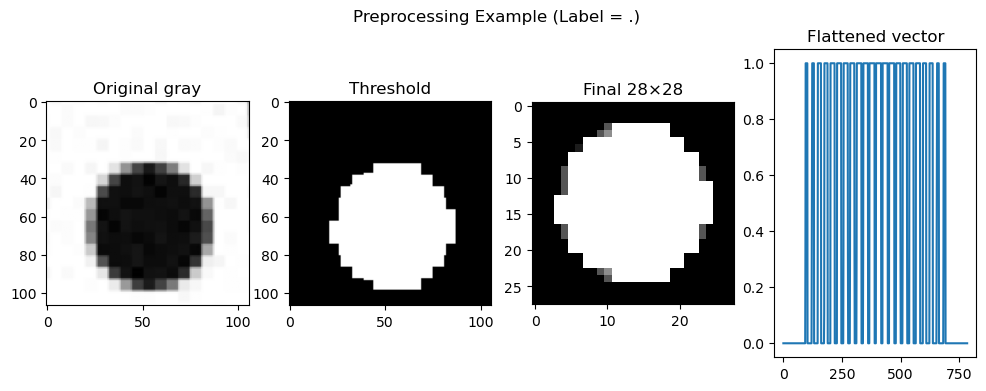

Final dataset: (439, 784) (439,)
Classes detected: ['*', '.', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', ':', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']


In [4]:
def preprocess_digit(img_bgr):
    # 1. convert to grayscale
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # 2. threshold
    _, bw = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # 3. find bounding box (digit area)
    ys, xs = np.where(bw == 255)
    if len(xs) == 0 or len(ys) == 0:
        return None, None

    x1, x2 = xs.min(), xs.max()
    y1, y2 = ys.min(), ys.max()
    digit = bw[y1 : y2 + 1, x1 : x2 + 1]

    # 4. resize longest side to 22 px
    h, w = digit.shape
    if h > w:
        new_h, new_w = 22, int(w * (22 / h))
    else:
        new_w, new_h = 22, int(h * (22 / w))

    digit_resized = cv2.resize(digit, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # 5. pad to 28x28
    top = (28 - new_h) // 2
    bottom = 28 - new_h - top
    left = (28 - new_w) // 2
    right = 28 - new_w - left

    digit_padded = cv2.copyMakeBorder(
        digit_resized, top, bottom, left, right, cv2.BORDER_CONSTANT, value=0
    )

    # 6. normalize
    digit_norm = digit_padded.astype("float32") / 255.0
    flat = digit_norm.flatten()

    return flat, digit_padded


# ---------------------------------------------------------
# UPDATED LOOP (generalized to ANY classes)
# ---------------------------------------------------------

X = []
y = []

preview_shown = {}  # dictionary to track shown classes

for idx, row in dataset_info.iterrows():
    img_path = dataset_dir / row["filepath"]
    img_bgr = cv2.imread(str(img_path))

    if img_bgr is None:
        print("Missing:", img_path)
        continue

    flat, digit_padded = preprocess_digit(img_bgr)
    if flat is None:
        print("Invalid extraction:", img_path)
        continue

    label = row["label"]  # can be '0', '1', ..., 'a', 'b', ...

    if label == "asterisk":
        label = "*"
    elif label == "dot":
        label = "."
    elif label == "colon":
        label = ":"

    # ------------------------------------------
    # SHOW PREVIEW ONCE *PER CLASS*
    # ------------------------------------------
    if label not in preview_shown:
        fig, ax = plt.subplots(1, 4, figsize=(12, 4))

        gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
        _, bw = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

        ax[0].imshow(gray, cmap="gray")
        ax[0].set_title("Original gray")

        ax[1].imshow(bw, cmap="gray")
        ax[1].set_title("Threshold")

        ax[2].imshow(digit_padded, cmap="gray")
        ax[2].set_title("Final 28×28")

        ax[3].plot(flat)
        ax[3].set_title("Flattened vector")

        plt.suptitle(f"Preprocessing Example (Label = {label})")
        plt.show()

        preview_shown[label] = True

    # ------------------------------------------
    # STORE DATASET
    # ------------------------------------------
    X.append(flat)
    y.append(label)

# convert to numpy arrays
X = np.array(X)
y = np.array(y)

print("Final dataset:", X.shape, y.shape)
print("Classes detected:", sorted(preview_shown.keys()))

# 3. Data Splitting

Now, for easy to develop and test, we can try to splitted the data into 2 types:

- training,
- and testing


In [5]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=22
)

# 4. Classification Modelling

To possible classifiying images into 3 different characters (0, 1, and 2), we can use several machine learning algorithms. Here is the options:

1. KNN (k Nearest Neighbor)
2. Logistic regression


## 4.1 KNN


Prepare to correctly pick how many `k` neighbor


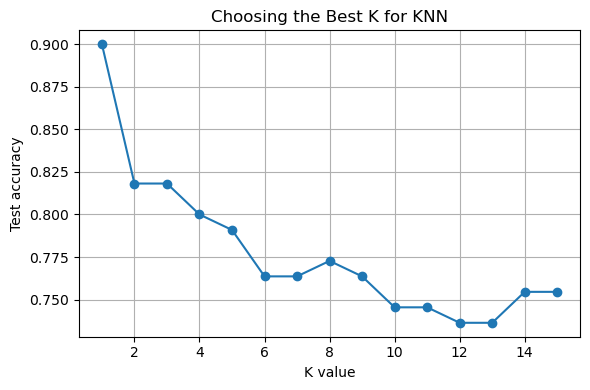

In [6]:
k_values = list(range(1, 16))
accuracies = []

# Evaluate accuracy for each K
for k in k_values:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

# Plot accuracy vs K
plt.figure(figsize=(6, 4))
plt.plot(k_values, accuracies, marker="o")
plt.xlabel("K value")
plt.ylabel("Test accuracy")
plt.title("Choosing the Best K for KNN")
plt.grid(True)
plt.tight_layout()
plt.show()

In [7]:
model_knn = KNeighborsClassifier(n_neighbors=1)
model_knn.fit(X_train, y_train)

,n_neighbors,1
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [8]:
accuracy = model_knn.score(X_test, y_test)
print("Accuracy:", accuracy)

Accuracy: 0.9


In [9]:
single_pred_knn = model_knn.predict([X_test[0]])
print("Predicted:", single_pred_knn[0])
print("Actual:", y_test[0])

Predicted: s
Actual: s


## 4.2 Logistic regression


In [10]:
model_lr = LogisticRegression(max_iter=2000)
model_lr.fit(X_train, y_train)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,2000
,multi_class,'deprecated'


In [11]:
accuracy = model_lr.score(X_test, y_test)
print("Accuracy:", accuracy)

Accuracy: 0.9090909090909091


In [12]:
single_pred_lr = model_lr.predict([X_test[0]])
print("Predicted:", single_pred_lr[0])
print("Actual:", y_test[0])

Predicted: s
Actual: s


## 4.3 SVM


Find the best `C` for **SVM**


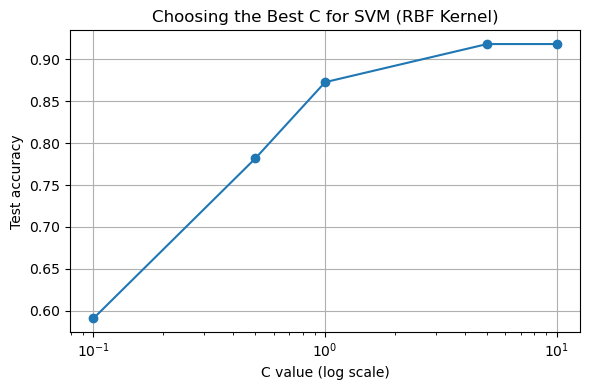

In [ ]:
C_values = [0.1, 0.5, 1, 5, 10]
accuracies = []

for C in C_values:
    model = SVC(kernel="rbf", C=C, gamma="scale")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)

# Plot accuracy vs C
plt.figure(figsize=(6, 4))
plt.plot(C_values, accuracies, marker="o")
plt.xscale("log")  # SVM parameters should be shown in log scale
plt.xlabel("C value (log scale)")
plt.ylabel("Test accuracy")
plt.title("Choosing the Best C for SVM (RBF Kernel)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [24]:
model_svm = SVC(C=10, kernel="rbf", probability=True, random_state=42)
model_svm.fit(X_train, y_train)

,C,10
,kernel,'rbf'
,degree,3
,gamma,'scale'
,coef0,0.0
,shrinking,True
,probability,True
,tol,0.001
,cache_size,200
,class_weight,None
,verbose,False


In [25]:
accuracy = model_svm.score(X_test, y_test)
print("Accuracy:", accuracy)

Accuracy: 0.9181818181818182


In [26]:
single_pred_lr = model_svm.predict([X_test[0]])
print("Predicted:", single_pred_lr[0])
print("Actual:", y_test[0])

Predicted: s
Actual: s


# 5. Model Summary

Let's summarize the model from our experiment


In [ ]:
def get_scores(y_true, y_pred):
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "precision": precision_score(y_true, y_pred, average="macro"),
        "recall": recall_score(y_true, y_pred, average="macro"),
        "f1_score": f1_score(y_true, y_pred, average="macro"),
    }


y_pred_knn = model_knn.predict(X_test)
y_pred_lr = model_lr.predict(X_test)
y_pred_svm = model_svm.predict(X_test)

scores_knn = get_scores(y_test, y_pred_knn)
scores_lr = get_scores(y_test, y_pred_lr)
scores_svm = get_scores(y_test, y_pred_svm)

summary = pd.DataFrame(
    {"KNN": scores_knn, "Logistic Regression": scores_lr, "SVM": scores_svm}
)

summary = summary.T
summary

c:\Users\KarlSchmidt\.conda\envs\gideon\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\KarlSchmidt\.conda\envs\gideon\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\KarlSchmidt\.conda\envs\gideon\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.s

,accuracy,precision,recall,f1_score
KNN,0.900000,0.788613,0.765831,0.764247
Logistic Regression,0.909091,0.720126,0.738245,0.716395
SVM,0.918182,0.808886,0.818182,0.796402


# 6. Model Evaluation



===== Learning Curves Analysis =====


c:\Users\KarlSchmidt\.conda\envs\gideon\Lib\site-packages\sklearn\model_selection\_split.py:811: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


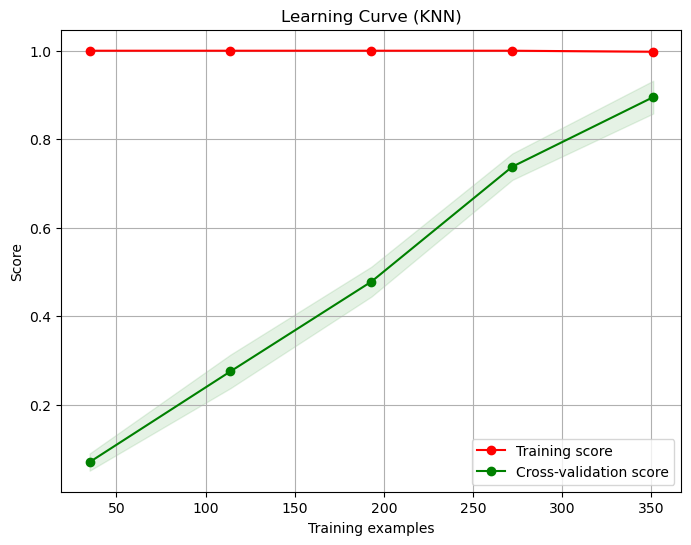

c:\Users\KarlSchmidt\.conda\envs\gideon\Lib\site-packages\sklearn\model_selection\_split.py:811: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


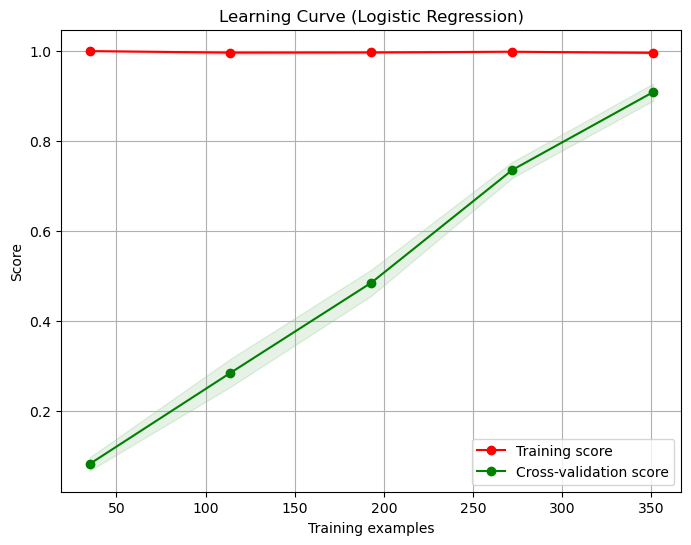

c:\Users\KarlSchmidt\.conda\envs\gideon\Lib\site-packages\sklearn\model_selection\_split.py:811: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


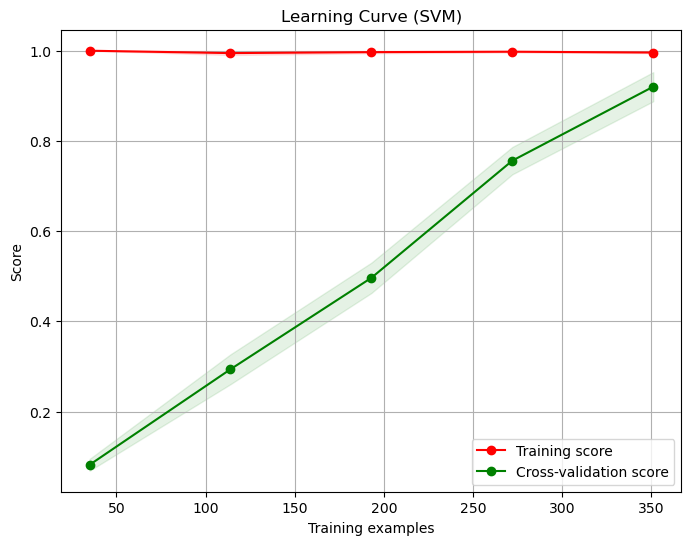

In [33]:
def plot_learning_curve(
    estimator,
    title,
    X,
    y,
    axes=None,
    ylim=None,
    cv=None,
    n_jobs=None,
    train_sizes=np.linspace(0.1, 1.0, 5),
):
    if axes is None:
        _, axes = plt.subplots(1, 1, figsize=(8, 6))

    axes.set_title(title)
    if ylim is not None:
        axes.set_ylim(*ylim)
    axes.set_xlabel("Training examples")
    axes.set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
        estimator,
        X,
        y,
        cv=cv,
        n_jobs=n_jobs,
        train_sizes=train_sizes,
        return_times=True,
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # Plot learning curve
    axes.grid()
    axes.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    axes.fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
        color="g",
    )
    axes.plot(train_sizes, train_scores_mean, "o-", color="r", label="Training score")
    axes.plot(
        train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
    )
    axes.legend(loc="best")

    return plt


print("\n===== Learning Curves Analysis =====")

# Plot learning curve for KNN
plot_learning_curve(model_knn, "Learning Curve (KNN)", X, y, cv=5, n_jobs=-1)
plt.show()

# Plot learning curve for Logistic Regression
plot_learning_curve(
    model_lr, "Learning Curve (Logistic Regression)", X, y, cv=5, n_jobs=-1
)
plt.show()

# Plot learning curve for SVM
plot_learning_curve(model_svm, "Learning Curve (SVM)", X, y, cv=5, n_jobs=-1)
plt.show()

# 7. Interactive Testing


In [18]:
# load model from .pkl format
# knn_model = joblib.load("../output/models/knn_model.pkl")
# logistic_model = joblib.load("../output/models/logistic_regression_model.pkl")

In [19]:
def preprocess_image(path: str):
    # Load grayscale
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise Exception(f"Error: image not found at {path}")

    # Resize to 28x28
    img_resized = cv2.resize(img, (28, 28))

    # Flatten
    img_flat = img_resized.flatten()

    # Normalize
    img_norm = img_flat / 255.0

    return img_norm, img_resized


def predict_all_models(img_norm: np.ndarray):
    # KNN
    pred_knn = model_knn.predict([img_norm])[0]

    # Logistic Regression
    pred_lr = model_lr.predict([img_norm])[0]

    # SVM
    pred_svm = model_svm.predict([img_norm])[0]

    return pred_knn, pred_lr, pred_svm


def predict_all_models_with_confidence(img_norm: np.ndarray):
    # ----- KNN -----
    pred_knn = model_knn.predict([img_norm])[0]

    # confidence = proportion of neighbors agreeing
    dist, idx = model_knn.kneighbors([img_norm], n_neighbors=model_knn.n_neighbors)
    neigh_labels = y_train[idx[0]]
    count = (neigh_labels == pred_knn).sum()
    confidence_knn = count / model_knn.n_neighbors

    # ----- Logistic Regression -----
    probs_lr = model_lr.predict_proba([img_norm])[0]
    pred_lr = probs_lr.argmax()
    confidence_lr = probs_lr[pred_lr]

    return {
        "KNN": (pred_knn, confidence_knn),
        "LR": (pred_lr, confidence_lr),
    }


In [28]:
# Path to your test image
test_path = "../../input/new/ref_id.jpg"  # change to your file

# Preprocess
img_norm, img_resized = preprocess_image(test_path)

# Predict
pred_knn, pred_lr, pred_svm = predict_all_models(img_norm)

# Display results
print("===== Predictions for Custom Image =====")
print("KNN Prediction:               ", pred_knn)
print("Logistic Regression Prediction:", pred_lr)
print("SVM                           : ", pred_svm)

===== Predictions for Custom Image =====
KNN Prediction:                .
Logistic Regression Prediction: .
SVM                           :  n


In [21]:
def segment_characters(img_bgr):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    _, bw = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # find contours (characters)
    contours, _ = cv2.findContours(bw, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # bounding boxes
    boxes = [cv2.boundingRect(c) for c in contours]

    # sort left to right
    boxes = sorted(boxes, key=lambda b: b[0])

    chars = []
    for x, y, w, h in boxes:
        char_img = img_bgr[y : y + h, x : x + w]
        chars.append(char_img)

    return chars


def predict_word(img_path, model) -> str:
    img = cv2.imread(img_path)
    chars = segment_characters(img)

    processed = []
    for ch in chars:
        flat, _ = preprocess_digit(ch)
        if flat is not None:
            processed.append(flat)

    if not processed:
        return ""

    preds = model.predict(processed)
    return "".join(preds)


In [29]:
path_target = "../../input/new/rp25304.jpg"

print(f"KNN result: {predict_word(path_target, model_knn)}")
print(f"Linear regression result: {predict_word(path_target, model_lr)}")
print(f"SVM result: {predict_word(path_target, model_svm)}")

KNN result: rp25.304
Linear regression result: rp25.304
SVM result: rp25.304


# 8. Save the Models


In [30]:
output_models_dir = "../../output/models"

joblib.dump(model_knn, f"{output_models_dir}/knn_model.pkl")
joblib.dump(model_lr, f"{output_models_dir}/logistic_regression_model.pkl")
joblib.dump(model_svm, f"{output_models_dir}/svm_model.pkl")

print("Models successfully to save!")

Models successfully to save!
